<a href="https://colab.research.google.com/github/Mobeens007/geog313_project/blob/main/GEOG213_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Objectives, achievements and Limitations for this Project**

## **Objectives**

My primary aim is to develop a proficiency in utilizing Python for geospatial analysis, effectively utilizing various Python packages and functions. I intend to acquire skills in establishing a reproducible workflow in Python, manipulating geospatial data, and implementing scalable and parallel computation methods.
The project is titled "Evaluating the Impact of Aerosols on Crops and Analyzing Time Series Trends."

## **Achievements**
Throughout this project, I acquired practical knowledge in utilizing cloud platforms and diverse APIs for the manipulation of extensive geospatial data. Exploring various concepts deepened my understanding of data product utilization, workflow management, scalable analysis, and various computation techniques.
A notable aspect of my learning journey was troubleshooting. Confronted with numerous problems and errors, I developed the skill of identifying issues and finding solutions. This process broadened my understanding of which platforms to consult for troubleshooting, prompting me to approach problem-solving in a more nuanced manner.
While the results of my project may not be statistically significant, the wealth of knowledge I acquired is invaluable.I now have a clearer understanding of how to enhance my future work, leveraging these experiences to improve and refine my approach.

## **Limitations**
I've experimented with various APIs such as Microsoft Planetary Computer, Google Earth Engine, and Google Colab. I've gained familiarity with different products offered in these APIs, including MODIS products, Sentinel-3 products, and Sentinel-5 products for aerosol and vegetation analysis.

However, there are some limitations. PC Hub provides vegetation indices but lacks aerosol indices. In Google Earth Engine and Colab, Sentinel-3 is unavailable, and although it offers both vegetation indices, I encountered difficulties converting them into xarray format. On the other hand, Sentinel-5 provides aerosol indices but lacks vegetation indices, making it unsuitable for my specific needs.

# **Install Required Libraries**






In [1]:
# Install geemap and rasterio
!pip install geemap
!pip install rasterio

# **Import Required Libraries**

In [2]:
# Import required libraries
import google.colab
import geemap
import geemap.colormaps as cm
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely as shp
import rasterio

# **Google Earth Engine Authentication and Initialization**

In [3]:
import ee
ee.Authenticate()
ee.Initialize(project = 'ee-ranamobeen269')

# **Install geemap as basemap**

In [4]:
Map = geemap.Map(center=[30,70], zoom=5)
Map.add_basemap("SATELLITE")
#Map.add_basemap("ROADMAP")
#Map.add_basemap("TERRAIN")
#Map.add_basemap("HYBRID")
#Map.add_basemap("ESRI")
#Map.add_basemap("Esri National Geographic")
#Map.add_basemap("Google Maps")

## **Area of Interest** (Geometry)

In [5]:
geometry = ee.Geometry.Rectangle([[74.17870013988589, 31.37985262074622], [74.51515643871402, 31.62924675431965]])
Map.addLayer(geometry, {}, "Geometry")

## **Region Of Interest** (Lahore)

In [6]:
Map = geemap.Map(center=[40, 100], zoom=5)
lhr = ee.FeatureCollection('users/ranamobeen269/Lahore-District')
lhr = lhr.geometry()
Map.addLayer(lhr, {}, "Lahore")
Map.centerObject(lhr, 10)
Map

Map(center=[31.445905529235013, 74.35499614420061], controls=(WidgetControl(options=['position', 'transparent_…

## **Import MODIS** (Aerosol Optical Depth)

In [7]:
# Import MODIS Terra & Aqua MAIAC Land Aerosol Optical Depth Daily 1km

modis_aod_047_collections = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES').filterBounds(lhr)
modis_aod_047 = modis_aod_047_collections.filterBounds(lhr) .select('Optical_Depth_047') .filterDate('2001-01-01', '2023-12-30') .mean() .clip(lhr)

modis_aod_055_collections = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES')
modis_aod_055  = modis_aod_055_collections.filterBounds(lhr) .select('Optical_Depth_055').filterDate('2001-01-01', '2023-12-30').mean().clip(lhr)

# Set visualization parameters.
aod_viz_params = { 'min': 0, 'max': 1100, 'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']}

Map.addLayer(modis_aod_047, aod_viz_params, 'MODIS_AOD_047')
Map.addLayer(modis_aod_055, aod_viz_params, 'MODIS_AOD_055')
Map

Map(bottom=107229.0, center=[31.445905529235013, 74.35499614420061], controls=(WidgetControl(options=['positio…

In [8]:
modis_aod_055_collections

## **Visualizing Aerosol Optical Depth**

In [9]:
# The code has been copied to the clipboard.
# Press Ctrl+V to in a code cell to paste it.
aod47_imageCollections = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES') \
  .select('Optical_Depth_047') \
  .filterDate('2022-06-01', '2022-12-30')

# print(aod47_imageCollections)

band_viz = {
  'min': 0,
  'max': 1100,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
}

Map.addLayer(aod47_imageCollections.mean().clip(lhr), band_viz, 'Optical Depth 047')

aod55_imageCollections = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES') \
  .select('Optical_Depth_055') \
  .filterDate('2022-06-01', '2022-12-30')

# print(aod55_imageCollections)

band_viz = {
  'min': 0,
  'max': 1100,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
}

Map.addLayer(aod55_imageCollections.mean().clip(lhr), band_viz, 'Optical Depth 055')
Map

Map(bottom=107229.0, center=[31.445905529235013, 74.35499614420061], controls=(WidgetControl(options=['positio…

## **Define a function for yealry Image collections** (AOD)

In [10]:
# Define a function yearly image collections
def bitwiseExtract(input, fromBit, toBit):
  maskSize = ee.Number(1).add(toBit).subtract(fromBit)
  mask = ee.Number(1).leftShift(maskSize).subtract(1)
  return input.rightShift(fromBit).bitwiseAnd(mask)

def applyQaMask(image):
  AOD = image.select('Optical_Depth_047')
  QA = image.select('AOD_QA')

  cloudMaskBitPos = 0
  aerosolQualityBitPos = 8

  # Extract the relevant bits for cloud masking and aerosol quality
  cloudMask = bitwiseExtract(QA, cloudMaskBitPos, cloudMaskBitPos + 1).lte(1)
  aerosolQualityMask = bitwiseExtract(QA, aerosolQualityBitPos, aerosolQualityBitPos + 3).eq(0)

  # Combine the cloud mask and aerosol quality mask
  mask = cloudMask.And(aerosolQualityMask)

  # Update the mask and return the image
  return AOD.updateMask(mask)

dataset = ee.ImageCollection('MODIS/061/MCD19A2_GRANULES') \
    .filterBounds(geometry) \
    .map(applyQaMask)

# The code has been copied to the clipboard.
# Press Ctrl+V to in a code cell to paste it.
years = ee.List.sequence(2001, 2022); # Year range

def func_ojl(y):
  yearlyImage = dataset.filter(ee.Filter.calendarRange(y, y, 'year')) \
                          .mean() \
                          .clip(geometry) \
                          .set('year', y)
  return yearlyImage

aod_yearly_collection = ee.ImageCollection(years.map(func_ojl
))

In [11]:
aod_yearly_collection

## **Retrieve the AOI image list and plot**

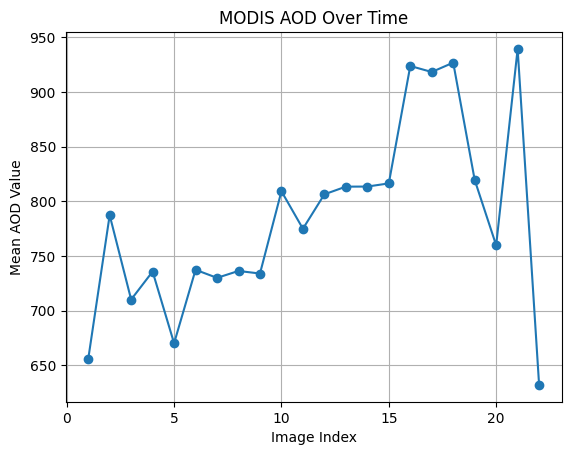

In [12]:
# Get the image list from the collection
image_list = aod_yearly_collection.toList(aod_yearly_collection.size())

# Create an empty list to store NDVI values for each image
aod_values = []

# Iterate through the image list and extract NDVI values
for i in range(image_list.size().getInfo()):
    image = ee.Image(image_list.get(i))
    aod = image.select('Optical_Depth_047')  # Replace 'NDVI' with the actual band name for NDVI
    # Define the region of interest, replace with your region geometry
    region_of_interest = lhr
    aod_mean = aod.reduceRegion(ee.Reducer.mean(), geometry=region_of_interest).get('Optical_Depth_047').getInfo()
    aod_values.append(aod_mean)

# Create an array of image indices for the x-axis
aod_image_indices = list(range(1, len(aod_values) + 1))

# Plot the NDVI values over time
plt.plot(aod_image_indices, aod_values, marker='o', linestyle='-')
plt.title('MODIS AOD Over Time')
plt.xlabel('Image Index')
plt.ylabel('Mean AOD Value')
plt.grid(True)
plt.show()

## **Getting Yearly AOD Value**

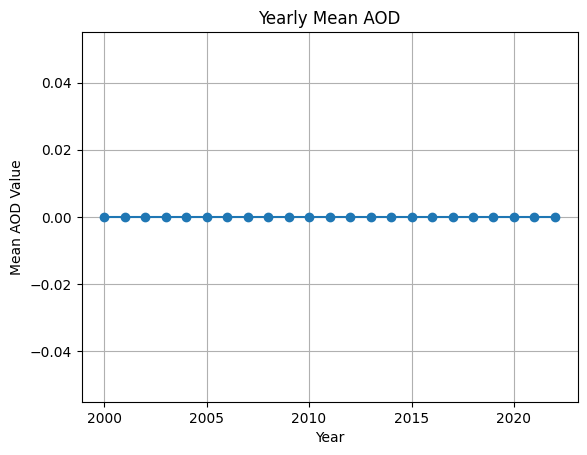

In [13]:
# Get the image list from the collection
image_list = aod_yearly_collection.toList(aod_yearly_collection.size())

# Create an empty list to store yearly mean AOD values
yearly_aod_values = []


# Iterate through the years and extract yearly mean AOD values
for year in range(2000, 2023):
    # Filter images for the specific year
    filtered_images = aod_yearly_collection.filter(
        ee.Filter.calendarRange(year, year, 'year'))

    # Iterate through the months and compute monthly mean AOD
    monthly_aod_values = []
    for month in range(1, 13):
        # Filter images for the specific month
        monthly_images = filtered_images.filter(
            ee.Filter.calendarRange(month, month, 'month'))

        # Check if there are images for the month
        if monthly_images.size().getInfo() > 0:
            # Compute the mean AD for the month
            monthly_aod = monthly_images.select('Optical_Depth_047').mean().reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=lhr,
                scale=500  # Adjust the scale according to your needs
            ).get('Optical_Depth_047').getInfo()

            monthly_aod_values.append(monthly_aod)
        else:
            # If no images for the month, append NaN
            monthly_aod_values.append(None)

    # Compute the yearly mean NDVI by averaging monthly values
    yearly_aod = sum(filter(None, monthly_aod_values)) / len(monthly_aod_values)

    yearly_aod_values.append(yearly_aod)

# Create a DataFrame for better handling of data
df = pd.DataFrame({
    'Year': range(2000, 2023),
    'Mean Yearly AOD': yearly_aod_values
})

# Plot the NDVI values over years
plt.plot(df['Year'], df['Mean Yearly AOD'], marker='o', linestyle='-')
plt.title('Yearly Mean AOD')
plt.xlabel('Year')
plt.ylabel('Mean AOD Value')
plt.grid(True)
plt.show()

## **Monthly Mean AOD For specific Year**

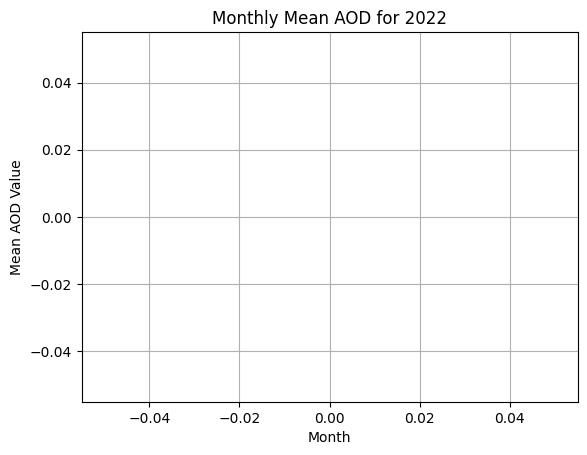

In [14]:
# Get the image list from the collection
image_list = aod_yearly_collection.toList(aod_yearly_collection.size())

# Create lists to store monthly mean AOD values for 2022
months = list(range(1, 13))
monthly_aod_values = [None] * len(months)  # Initialize with None

# Filter images for the year 2022
filtered_images_2022 = aod_yearly_collection.filter(
    ee.Filter.calendarRange(2001, 2022, 'year'))

# Iterate through the months and compute monthly mean AOD for 2022
for i, month in enumerate(months):
    # Filter images for the specific month in 2022
    monthly_images = filtered_images_2022.filter(
        ee.Filter.calendarRange(month, month, 'month'))

    # Check if there are images for the month
    if monthly_images.size().getInfo() > 0:
        # Compute the mean AOD for the month
        monthly_aod = monthly_images.select('NDVI').mean().reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=lhr,
            scale=500  # Adjust the scale according to your needs
        ).get('NDVI').getInfo()

        monthly_aod_values[i] = monthly_aod

# Create a DataFrame for better handling of data
df = pd.DataFrame({
    'Month': months,
    'Mean Monthly AOD (2022)': monthly_aod_values
})

# Plot the NDVI values for each month in 2022
plt.plot(df['Month'], df['Mean Monthly AOD (2022)'], marker='o', linestyle='-')
plt.title('Monthly Mean AOD for 2022')
plt.xlabel('Month')
plt.ylabel('Mean AOD Value')
plt.grid(True)
plt.show()

## **Import MODIS** (NDVI)

In [15]:
# Import MODIS Terra Vegetation Indices 16-Day Global 1km

modis_ndvi_collections = ee.ImageCollection('MODIS/061/MOD13A2').filterBounds(lhr)
modis_ndvi = modis_ndvi_collections.filterBounds(lhr) .select('NDVI') .filterDate('2000-01-01', '2023-12-30').mean().clip(lhr)
modis_evi_collections = ee.ImageCollection('MODIS/061/MOD13A2')
modis_evi = modis_evi_collections.filterBounds(lhr) .select('EVI') .filterDate('2000-01-01', '2023-12-30').mean().clip(lhr)

# Set visualization parameters
vi_viz_params = { 'min': 0, 'max': 9000, 'palette': ['ffffff', 'ce7e45', 'df923d', 'f1b555', 'fcd163', '99b718', '74a901',
    '66a000', '529400', '3e8601', '207401', '056201', '004c00', '023b01',
    '012e01', '011d01', '011301']}

Map.addLayer(modis_ndvi, vi_viz_params, 'MODIS_NDVI')
Map.addLayer(modis_evi, vi_viz_params, 'MODIS_EVI')
Map

Map(bottom=107229.0, center=[31.445905529235013, 74.35499614420061], controls=(WidgetControl(options=['positio…

In [12]:
modis_ndvi_collections

# **Define a function for yealry Image collections** (MODIS)

In [16]:
# Define a function for yearly ndvi images
years = ee.List.sequence(2001, 2022); # Year range

def func_ojl(y):
  yearlyImage = modis_ndvi_collections.filter(ee.Filter.calendarRange(y, y, 'year')) \
                          .mean() \
                          .clip(geometry) \
                          .set('year', y)
  return yearlyImage

ndvi_yearly_collection = ee.ImageCollection(years.map(func_ojl
))

In [17]:
ndvi_yearly_collection

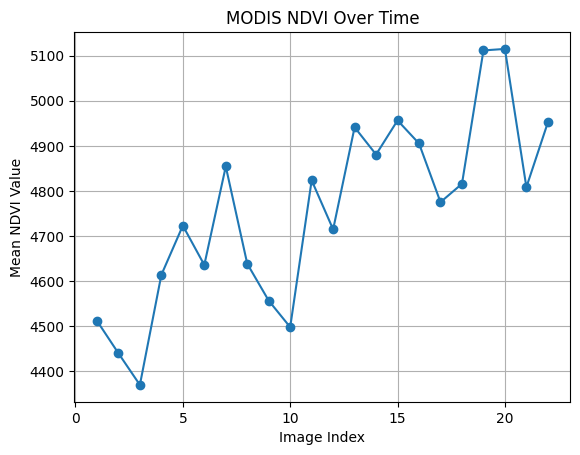

In [18]:
# Get the image list from the collection
image_list = ndvi_yearly_collection.toList(modis_ndvi_collections.size())

# Create an empty list to store NDVI values for each image
ndvi_values = []

# Iterate through the image list and extract NDVI values
for i in range(image_list.size().getInfo()):
    image = ee.Image(image_list.get(i))
    ndvi = image.select('NDVI')  # Replace 'NDVI' with the actual band name for NDVI
    # Define the region of interest, replace with your region geometry
    region_of_interest = geometry
    ndvi_mean = ndvi.reduceRegion(ee.Reducer.mean(), geometry=region_of_interest).get('NDVI').getInfo()
    ndvi_values.append(ndvi_mean)

# Create an array of image indices for the x-axis
ndvi_image_indices = list(range(1, len(ndvi_values) + 1))

# Plot the NDVI values over time
plt.plot(ndvi_image_indices, ndvi_values, marker='o', linestyle='-')
plt.title('MODIS NDVI Over Time')
plt.xlabel('Image Index')
plt.ylabel('Mean NDVI Value')
plt.grid(True)
plt.show()

## **Getting Mean NDVI Values Over the time**

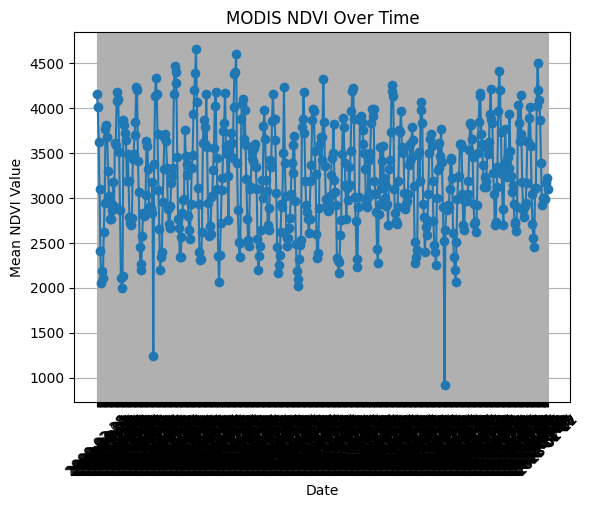

In [19]:
# Assuming you have a defined geometry for the region of interest
geometry = geometry

# Replace this with your actual MODIS NDVI collection
modis_ndvi_collection = ee.ImageCollection('MODIS/006/MOD13Q1').filterBounds(geometry)

# Get the image list from the collection
image_list = modis_ndvi_collection.toList(modis_ndvi_collection.size())

# Create an empty list to store NDVI values for each image
ndvi_values = []
dates = []  # List to store the acquisition dates

# Iterate through the image list and extract NDVI values and acquisition dates
for i in range(image_list.size().getInfo()):
    image = ee.Image(image_list.get(i))
    ndvi = image.select('NDVI')  # Replace 'NDVI' with the actual band name for NDVI

    # Get the acquisition date of the image
    date = ee.Date(image.get('system:time_start')).format("YYYY-MM-dd").getInfo()
    dates.append(date)

    # Define the region of interest, replace with your region geometry
    region_of_interest = geometry
    ndvi_mean = ndvi.reduceRegion(ee.Reducer.mean(), geometry=region_of_interest).get('NDVI').getInfo()
    ndvi_values.append(ndvi_mean)

# Plot the NDVI values over time
plt.plot(dates, ndvi_values, marker='o', linestyle='-')
plt.title('MODIS NDVI Over Time')
plt.xlabel('Date')
plt.ylabel('Mean NDVI Value')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

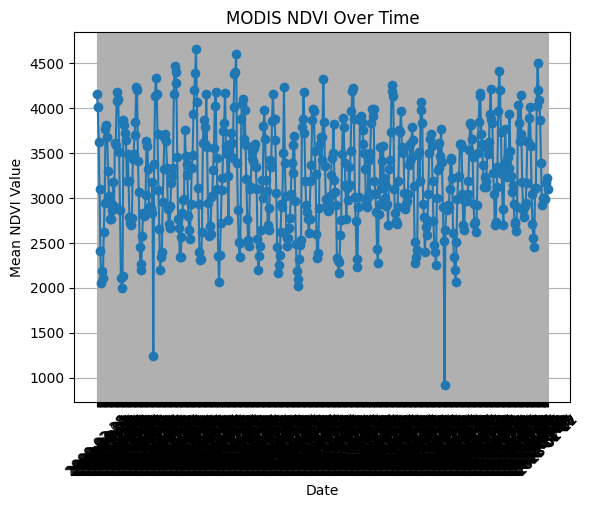

In [16]:
# Assuming you have a defined geometry for the region of interest
geometry = geometry

# Replace this with your actual MODIS NDVI collection
modis_ndvi_collection = ee.ImageCollection('MODIS/006/MOD13Q1').filterBounds(geometry)

# Get the image list from the collection
image_list = modis_ndvi_collection.toList(modis_ndvi_collection.size())

# Create an empty list to store NDVI values for each image
ndvi_values = []
dates = []  # List to store the acquisition dates

# Iterate through the image list and extract NDVI values and acquisition dates
for i in range(image_list.size().getInfo()):
    image = ee.Image(image_list.get(i))
    ndvi = image.select('NDVI')  # Replace 'NDVI' with the actual band name for NDVI

    # Get the acquisition date of the image
    date = ee.Date(image.get('system:time_start')).format("YYYY-MM-dd").getInfo()
    dates.append(date)

    # Define the region of interest, replace with your region geometry
    region_of_interest = geometry
    ndvi_mean = ndvi.reduceRegion(ee.Reducer.mean(), geometry=region_of_interest).get('NDVI').getInfo()
    ndvi_values.append(ndvi_mean)

# Plot the NDVI values over time
plt.plot(dates, ndvi_values, marker='o', linestyle='-')
plt.title('MODIS NDVI Over Time')
plt.xlabel('Date')
plt.ylabel('Mean NDVI Value')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

## **Getting Yearly NDVI Over Time**

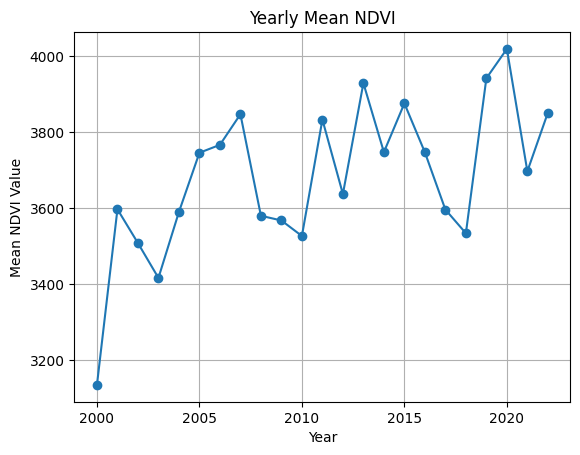

In [20]:
# Get the image list from the collection
image_list = modis_ndvi_collections.toList(modis_ndvi_collections.size())

# Create an empty list to store yearly mean NDVI values
yearly_ndvi_values = []

# Load your AOI shapefile
#aoi = ee.FeatureCollection('users/your_username/path/to/your/shapefile')

# Iterate through the years and extract yearly mean NDVI values
for year in range(2000, 2023):
    # Filter images for the specific year
    filtered_images = modis_ndvi_collections.filter(
        ee.Filter.calendarRange(year, year, 'year'))

    # Iterate through the months and compute monthly mean NDVI
    monthly_ndvi_values = []
    for month in range(1, 13):
        # Filter images for the specific month
        monthly_images = filtered_images.filter(
            ee.Filter.calendarRange(month, month, 'month'))

        # Check if there are images for the month
        if monthly_images.size().getInfo() > 0:
            # Compute the mean NDVI for the month
            monthly_ndvi = monthly_images.select('NDVI').mean().reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=lhr,
                scale=500  # Adjust the scale according to your needs
            ).get('NDVI').getInfo()

            monthly_ndvi_values.append(monthly_ndvi)
        else:
            # If no images for the month, append NaN
            monthly_ndvi_values.append(None)

    # Compute the yearly mean NDVI by averaging monthly values
    yearly_ndvi = sum(filter(None, monthly_ndvi_values)) / len(monthly_ndvi_values)

    yearly_ndvi_values.append(yearly_ndvi)

# Create a DataFrame for better handling of data
df = pd.DataFrame({
    'Year': range(2000, 2023),
    'Mean Yearly NDVI': yearly_ndvi_values
})

# Plot the NDVI values over years
plt.plot(df['Year'], df['Mean Yearly NDVI'], marker='o', linestyle='-')
plt.title('Yearly Mean NDVI')
plt.xlabel('Year')
plt.ylabel('Mean NDVI Value')
plt.grid(True)
plt.show()

## Getting Average Monthly NDVI Over **Time**

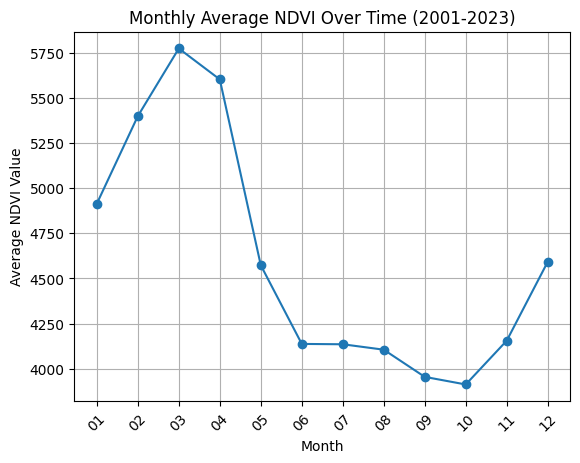

In [27]:
# Function to calculate monthly mean NDVI and plot the results
def plot_monthly_ndvi(image_collection, region_of_interest):
    # Get the image list from the collection
    image_list = image_collection.toList(image_collection.size())

    # Create lists to store monthly mean NDVI values and months
    monthly_values = [[] for _ in range(12)]  # List to store values for each month
    months = []

    # Iterate through the months in the date range
    for year in range(2001, 2024):
        for month in range(1, 13):
            start_date = datetime.datetime(year, month, 1)
            end_date = datetime.datetime(year, month + 1, 1) if month < 12 else datetime.datetime(year + 1, 1, 1)

            # Filter the collection for the current month
            month_collection = (image_collection
                                .filterBounds(region_of_interest)
                                .filterDate(ee.Date(start_date), ee.Date(end_date)))

            # Check if there are images in the collection for the current month
            count = month_collection.size().getInfo()
            if count > 0:
                # Select the NDVI band by its specific name (replace with the correct name)
                ndvi_band = month_collection.first().select('NDVI')

                # Calculate the mean NDVI for the month
                mean_ndvi = ndvi_band.reduceRegion(ee.Reducer.mean(), geometry=region_of_interest).get('NDVI').getInfo()

                # Append the result to the monthly values list
                monthly_values[month - 1].append(mean_ndvi)

                # Store the month for x-axis labels
                if year == 2001:
                    months.append(f"{month:02d}")

    # Calculate the average value for each month
    monthly_avg_values = [sum(month_values) / len(month_values) if month_values else None for month_values in monthly_values]

    # Plot the results
    plt.plot(months, monthly_avg_values, marker='o', linestyle='-')
    plt.title('Monthly Average NDVI Over Time (2001-2023)')
    plt.xlabel('Month')
    plt.ylabel('Average NDVI Value')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.grid(True)
    plt.show()

# Example usage
region_of_interest = geometry

# Replace 'MODIS/006/MOD13Q1' with your actual MODIS NDVI collection
modis_ndvi_collection = ee.ImageCollection('MODIS/006/MOD13Q1')

# Call the function
plot_monthly_ndvi(modis_ndvi_collection, region_of_interest)

## **Monthly Mean NDVI for Specific year**

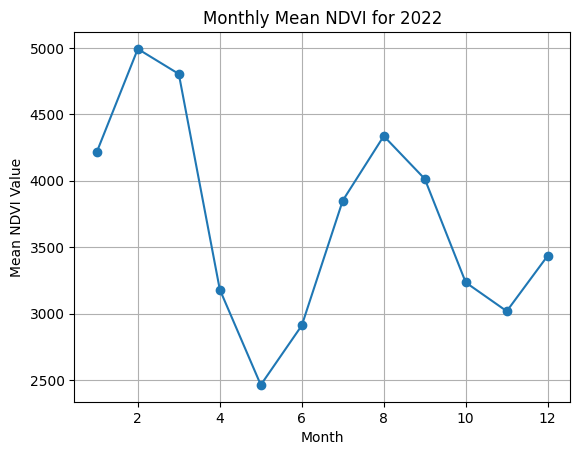

In [21]:
# Get the image list from the collection
image_list = modis_ndvi_collections.toList(modis_ndvi_collections.size())

# Create lists to store monthly mean NDVI values for 2022
months = list(range(1, 13))
monthly_ndvi_values = [None] * len(months)  # Initialize with None

# Filter images for the year 2022
filtered_images_2022 = modis_ndvi_collections.filter(
    ee.Filter.calendarRange(2001, 2022, 'year'))

# Iterate through the months and compute monthly mean NDVI for 2022
for i, month in enumerate(months):
    # Filter images for the specific month in 2022
    monthly_images = filtered_images_2022.filter(
        ee.Filter.calendarRange(month, month, 'month'))

    # Check if there are images for the month
    if monthly_images.size().getInfo() > 0:
        # Compute the mean NDVI for the month
        monthly_ndvi = monthly_images.select('NDVI').mean().reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=lhr,
            scale=500  # Adjust the scale according to your needs
        ).get('NDVI').getInfo()

        monthly_ndvi_values[i] = monthly_ndvi

# Create a DataFrame for better handling of data
df = pd.DataFrame({
    'Month': months,
    'Mean Monthly NDVI (2022)': monthly_ndvi_values
})

# Plot the NDVI values for each month in 2022
plt.plot(df['Month'], df['Mean Monthly NDVI (2022)'], marker='o', linestyle='-')
plt.title('Monthly Mean NDVI for 2022')
plt.xlabel('Month')
plt.ylabel('Mean NDVI Value')
plt.grid(True)
plt.show()

## **Relationship Between AOD AND MODIS**

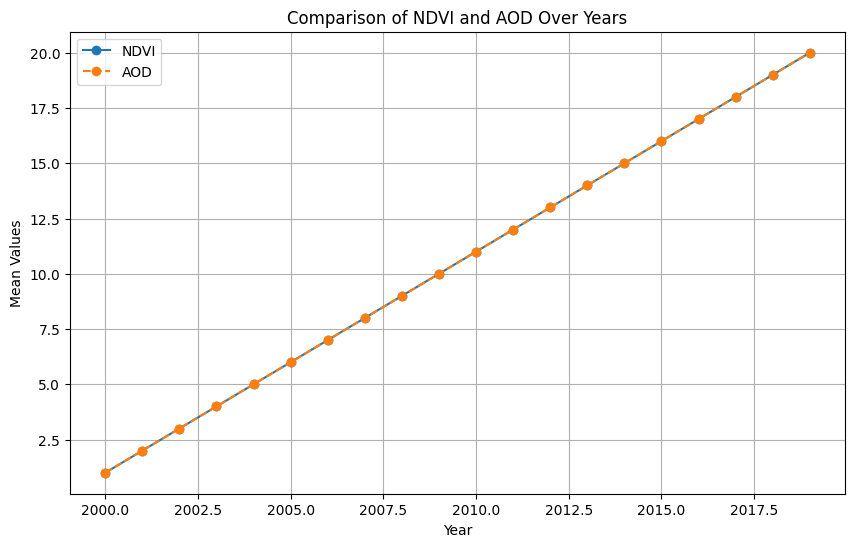

In [52]:
# Example data (replace with your actual data)
years = list(range(2000, 2020))
ndvi_values = ndvi_image_indices
aod_values = aod_image_indices
# Plotting the comparison
plt.figure(figsize=(10, 6))
plt.plot(years, ndvi_values, label='NDVI', marker='o', linestyle='-')
plt.plot(years, aod_values, label='AOD', marker='o', linestyle='--')

plt.title('Comparison of NDVI and AOD Over Years')
plt.xlabel('Year')
plt.ylabel('Mean Values')
plt.legend()
plt.grid(True)
plt.show()

## **Note**
I experimented with various approaches and build functions for manipulation. I systematically removed all practices, methods, functions, or code containing errors from the file, preserving them as a backup for future problem-solving endeavors.

Thanks